In [1]:
import os
import sys
from pathlib import Path

import anndata as ad
import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange
from matplotlib.patches import Patch
from skimage.transform import rescale, resize

sc.settings.verbosity = 3

In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [3]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

In [4]:
experiment = "Lung"
cores = ['B5', 'C6', 'D4', 'E4', 'E6', 'F4']
datasets = [f'{core}_{i}' for core in cores for i in range(1,5)] + ['F7_3', 'F7_4']


# Load data

In [5]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [6]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}_auto.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [7]:
adatas = []
df_sums = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    try:
        df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    except:
        pass
    df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
        df_morph["area"], axis=0
    )
    data_all = df_intensity_TS.iloc[:, 1:].values
    # data_all_norm = (data_all+0.1)/(np.percentile(data_all,50,axis=1,keepdims=True)+0.1)
    # data_all_norm = MinMaxScaler().fit_transform(data_all)
    # df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    # Merge TS and IMC data
    df = df_intensity_TS
    df.set_index("Id", inplace=True)
    df_sums.append(df.sum(axis=0))
    
    # Put to adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    sc.pp.normalize_total(adata, target_sum=1e5)
    sc.pp.log1p(adata)
    sc.pp.scale(adata)
    adatas.append(adata)
adata = ad.concat(adatas, join="inner")

Sucessfully read dataset B5_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset B5_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset B5_3


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


normalizing counts per cell
    finished ({time_passed})
B5_4 cannot be read
Sucessfully read dataset C6_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset C6_2


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset C6_3
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset C6_4
normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset D4_1
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset D4_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset D4_3
normalizing counts per cell
    finished (0:00:00)
D4_4 cannot be read
Sucessfully read dataset E4_1
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the futur

Sucessfully read dataset E4_2
normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset E4_3
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset E4_4
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset E6_1
normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset E6_2
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the futur

Sucessfully read dataset E6_3
normalizing counts per cell
    finished (0:00:00)
E6_4 cannot be read
Sucessfully read dataset F4_1
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset F4_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset F4_3
normalizing counts per cell
    finished (0:00:00)
F4_4 cannot be read
Sucessfully read dataset F7_3


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset F7_4
normalizing counts per cell
    finished ({time_passed})


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2289715652.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}.h5ad"
adata_IMC_cluster = ad.read_h5ad(path)


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [9]:
adata = adata[~adata.obs.Dataset.isin(['F7_1', 'F7_2'])]
adata_IMC_cluster = adata_IMC_cluster[~adata_IMC_cluster.obs.Dataset.isin(['F7_1', 'F7_2'])]

In [10]:
df_sum = pd.concat(df_sums, axis=1).mean(axis=1)
mz_qc = df_sum[(df_sum > 32000)].index.tolist()

In [11]:
len(mz_qc)

146

In [12]:
adata = adata[:, mz_qc]

In [13]:
adata

View of AnnData object with n_obs × n_vars = 19507 × 146
    obs: 'Cell', 'Dataset', 'Core'
    obsm: 'spatial'

## Get literature lut

In [14]:
SIMS_masses = adata.var_names

In [15]:
# Read litterature lut
file_path = data_dir / "metadata" / 'Putative_annotation_09012022.xlsx'
df = pd.read_excel(file_path)
lum = df['m/z'].to_numpy()

# get matched table by looking at difference with error
error = 0.4
matched_dfs = []
for mz in SIMS_masses.astype(float):
    if mz < 1.1:
        continue
    diff = lum-mz
    matched = df[abs(diff)<error]
    if len(matched) > 0:
        matched.loc[:,'SIMS mz'] = mz
        matched_dfs.append(matched)
    else:
        matched = pd.DataFrame([['', '', '', '', mz]], columns=df.columns.tolist() + ['SIMS mz'])
        matched_dfs.append(matched)
matched = pd.concat(matched_dfs)

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched.loc[:,'SIMS mz'] = mz
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched.loc[:,'SIMS mz'] = mz
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [16]:
# Get all info from litterature excel
SIMS_masses_subset = np.array(matched['SIMS mz'].to_list(), dtype=float).astype(str)
SIMS_masses_subset = pd.Index(SIMS_masses_subset)

SIMS_name_subset = np.array(matched['Molecules'].to_list()).astype(str)
SIMS_name_subset = pd.Index(SIMS_name_subset)

SIMS_nm_subset = SIMS_masses_subset + 'm/z ' + SIMS_name_subset

SIMS_type_subset = np.array(matched['Type'].to_list()).astype(str)
SIMS_type_subset = pd.Index(SIMS_type_subset)

print(f"Number of matched m/z: {len(SIMS_masses_subset)}")

Number of matched m/z: 145


In [17]:
adata_all = adata.copy()
adata = adata[:, SIMS_masses_subset]
adata.var_names = SIMS_nm_subset

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Rename clusters

In [18]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [19]:
adata_CN = adata_IMC_cluster.copy()

In [20]:
adata_CN[:,'CD31']

View of AnnData object with n_obs × n_vars = 19507 × 1
    obs: 'Cell', 'Dataset', 'Core', 'leiden'
    var: 'mean', 'std'
    uns: 'Dataset_colors', 'dendrogram_leiden', 'leiden', 'neighbors', 'umap'
    obsm: 'Scanorama', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

# Plot CD31 intensity

In [21]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan

    for cells, intensity in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols] = intensity

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [22]:
experiment='Lung'

In [23]:
masks = get_masks(data_dir / "masks", f"{experiment}")

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/937 [00:00<?, ?it/s]

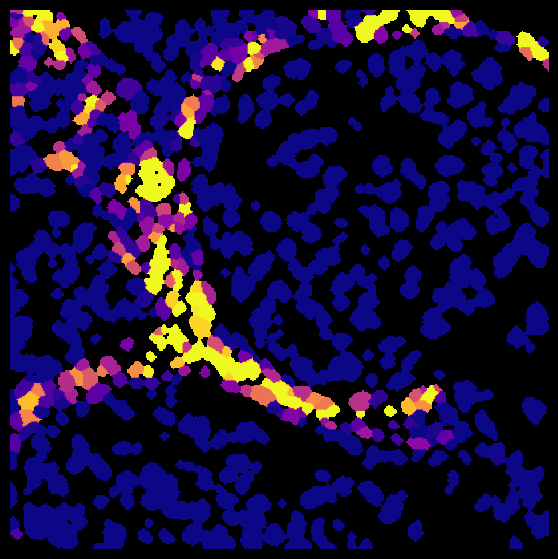

  0%|          | 0/960 [00:00<?, ?it/s]

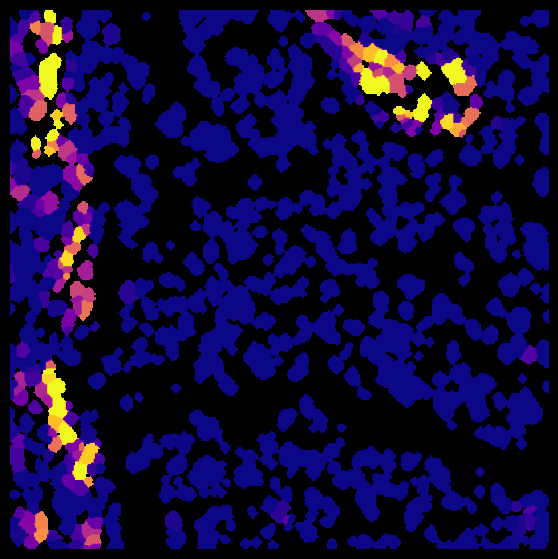

  0%|          | 0/993 [00:00<?, ?it/s]

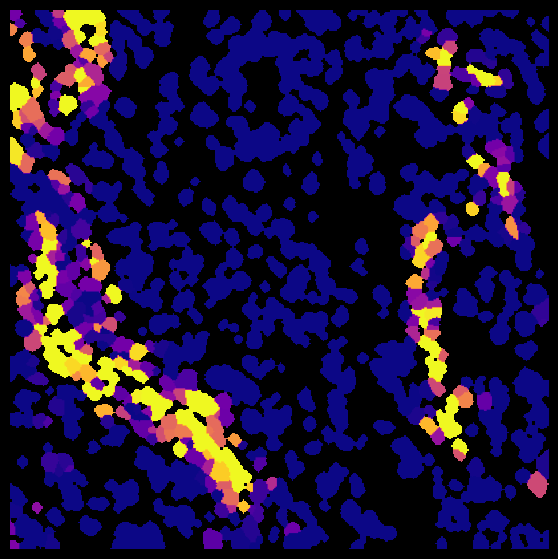

  0%|          | 0/905 [00:00<?, ?it/s]

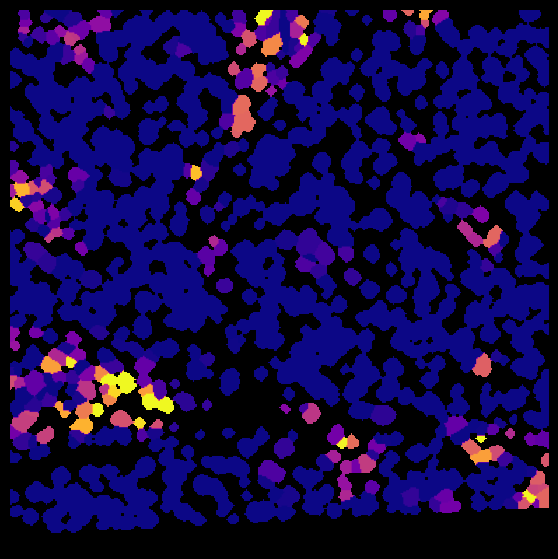

  0%|          | 0/970 [00:00<?, ?it/s]

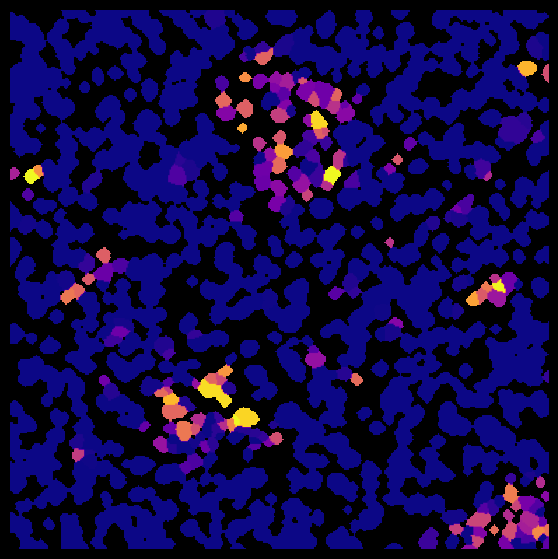

  0%|          | 0/1282 [00:00<?, ?it/s]

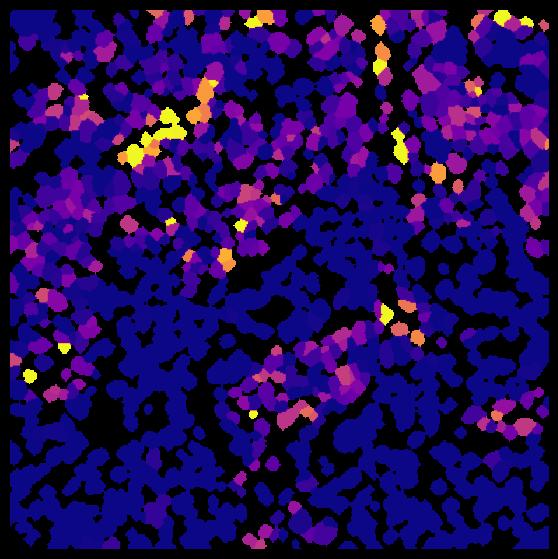

  0%|          | 0/866 [00:00<?, ?it/s]

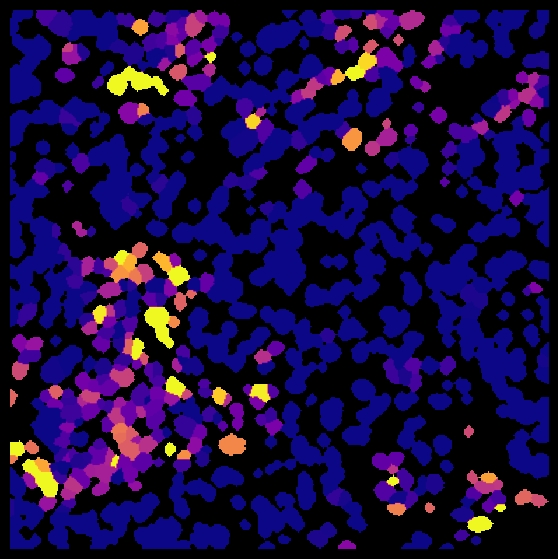

  0%|          | 0/948 [00:00<?, ?it/s]

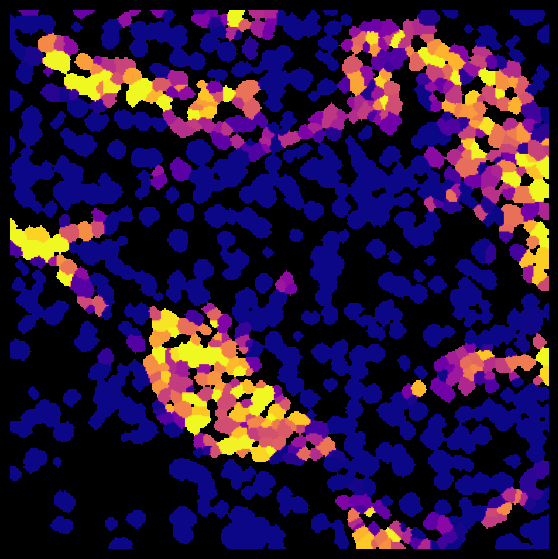

  0%|          | 0/1117 [00:00<?, ?it/s]

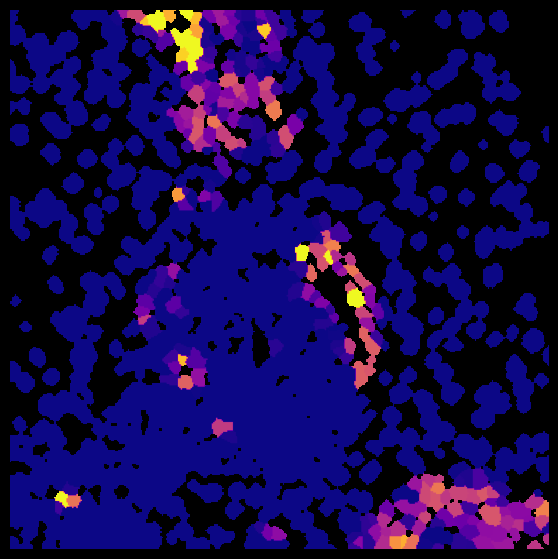

  0%|          | 0/456 [00:00<?, ?it/s]

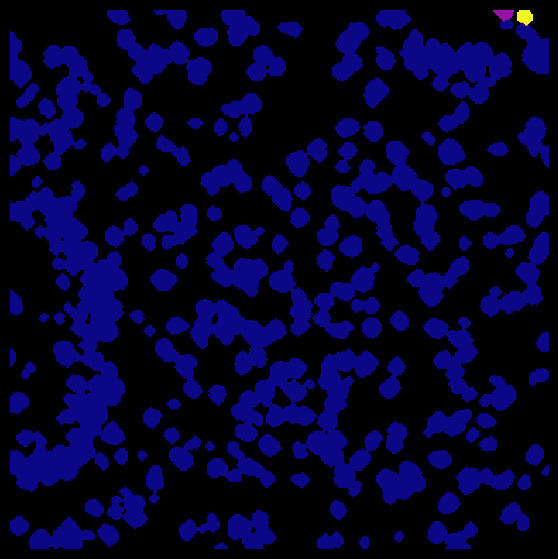

  0%|          | 0/738 [00:00<?, ?it/s]

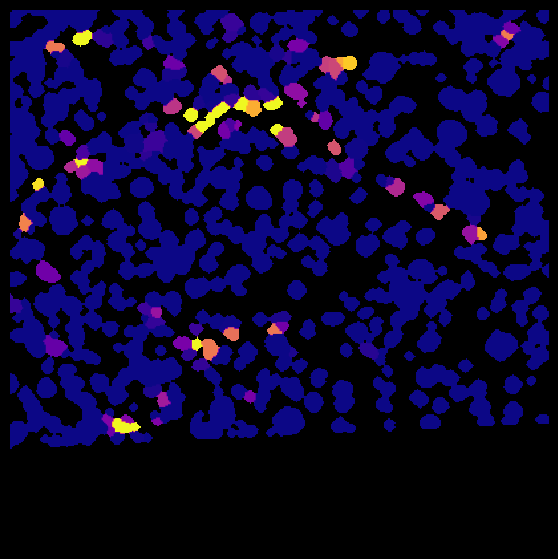

  0%|          | 0/931 [00:00<?, ?it/s]

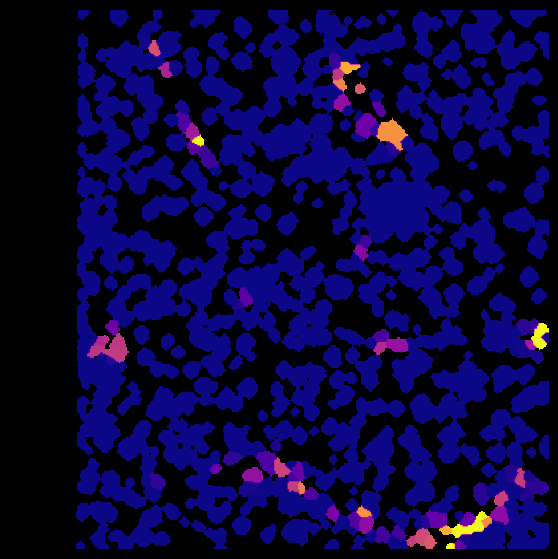

  0%|          | 0/1293 [00:00<?, ?it/s]

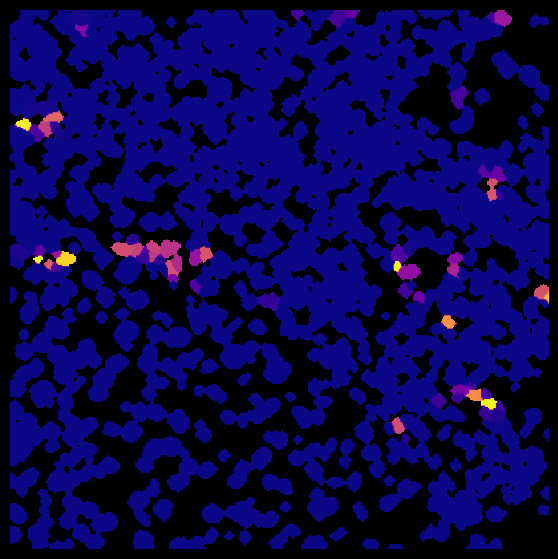

  0%|          | 0/1209 [00:00<?, ?it/s]

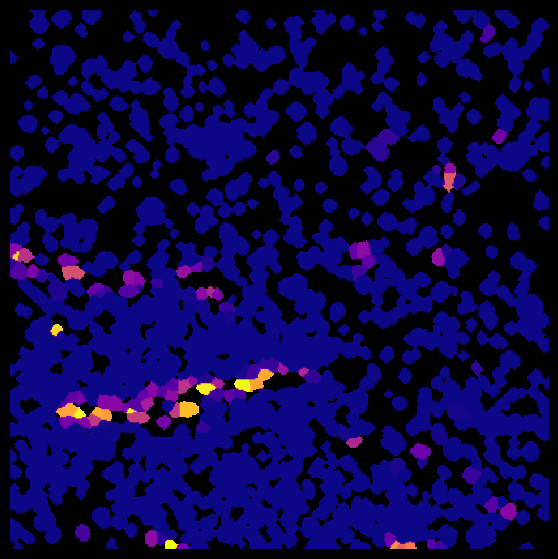

  0%|          | 0/533 [00:00<?, ?it/s]

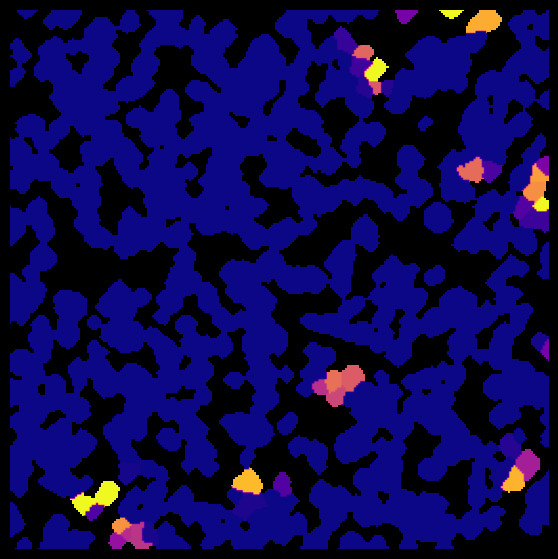

  0%|          | 0/415 [00:00<?, ?it/s]

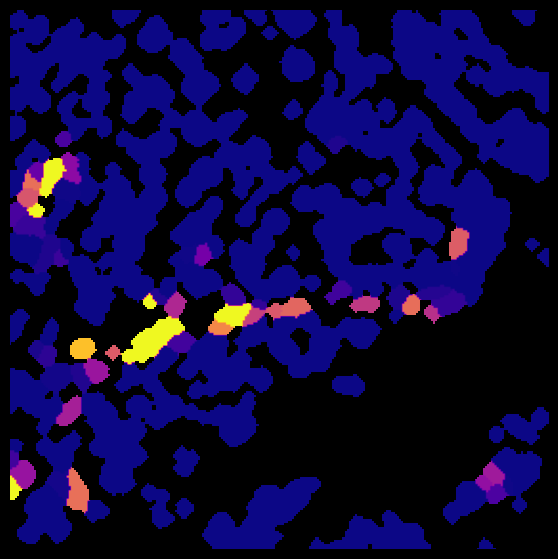

  0%|          | 0/474 [00:00<?, ?it/s]

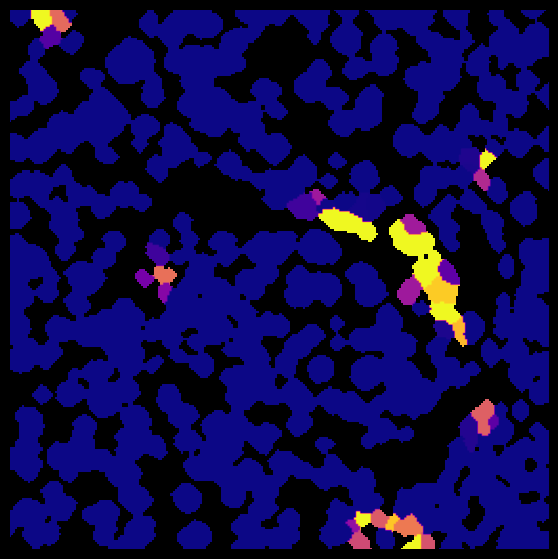

  0%|          | 0/1072 [00:00<?, ?it/s]

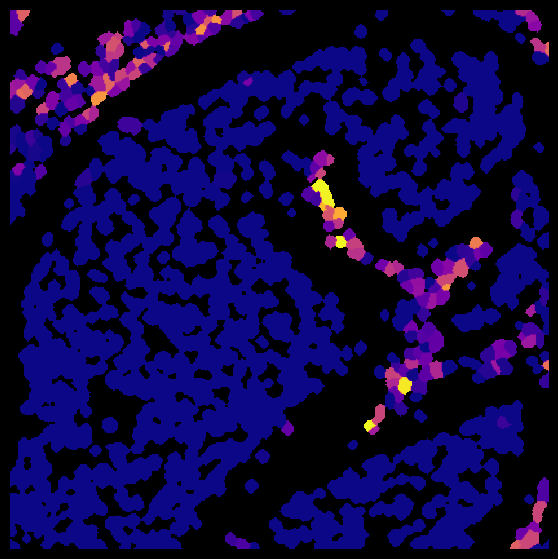

  0%|          | 0/1180 [00:00<?, ?it/s]

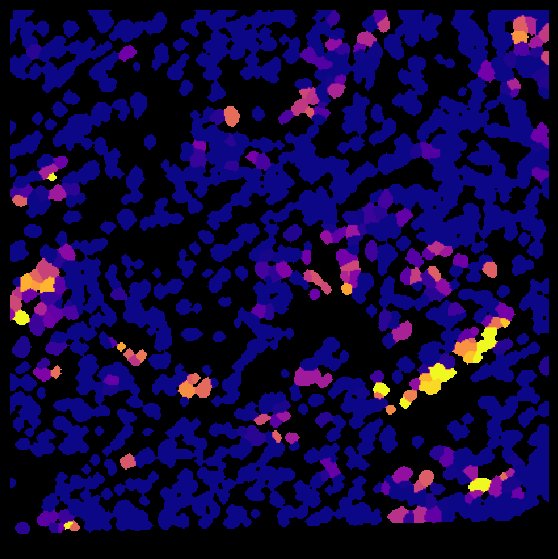

  0%|          | 0/1133 [00:00<?, ?it/s]

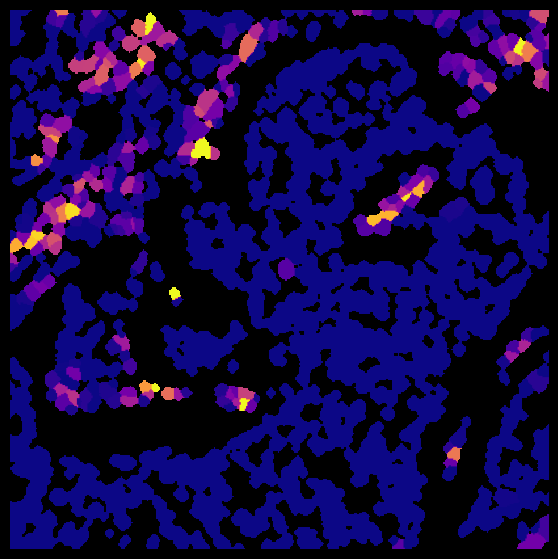

  0%|          | 0/450 [00:00<?, ?it/s]

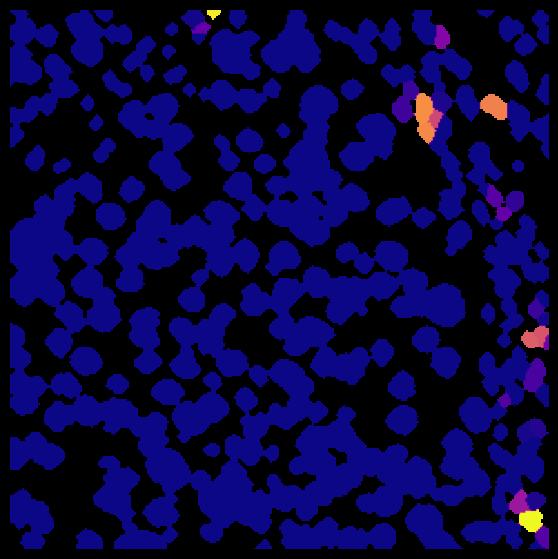

  0%|          | 0/645 [00:00<?, ?it/s]

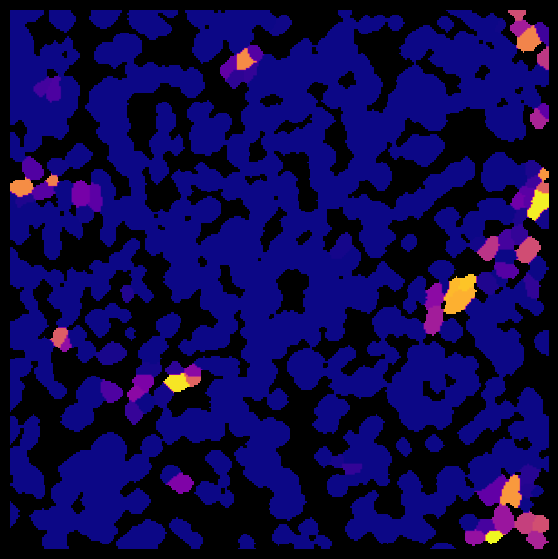

In [24]:
for dataset in adata_CN.obs['Dataset'].unique():
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    cell_ids = adata_fov.obs.Cell.to_list()
    intensities = adata_fov[:,'CD31'].X.flatten()
    
    for i, cell in enumerate(cell_ids):
        label2cell[cell] = intensities[i]

    img = create_clustered_cell(mask, label2cell)

    fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
    ax.imshow(img, cmap='plasma', vmin=np.nanquantile(img, 0.2))
    ax.axis("off")
    plt.show()

# Distance to CD31 positif

In [25]:
from sklearn.neighbors import NearestNeighbors

def get_distance(adata, adata_ref, n=1):
    data_ref = adata_ref.obsm["spatial"]
    data = adata.obsm["spatial"]
    fit = NearestNeighbors(n_neighbors=n ).fit(data_ref)
    m = fit.kneighbors(data)
    m = m[0], m[1] # Distances, Indices

    return m[0]


C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/937 [00:00<?, ?it/s]

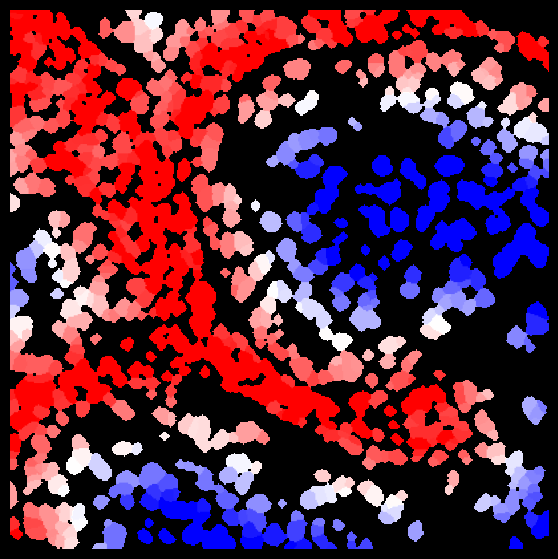

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/960 [00:00<?, ?it/s]

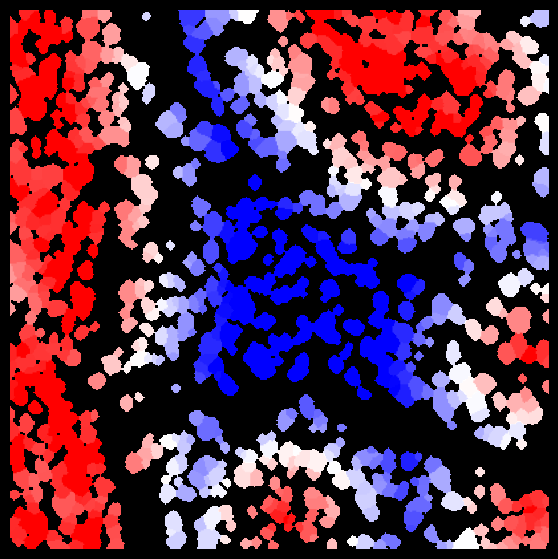

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/993 [00:00<?, ?it/s]

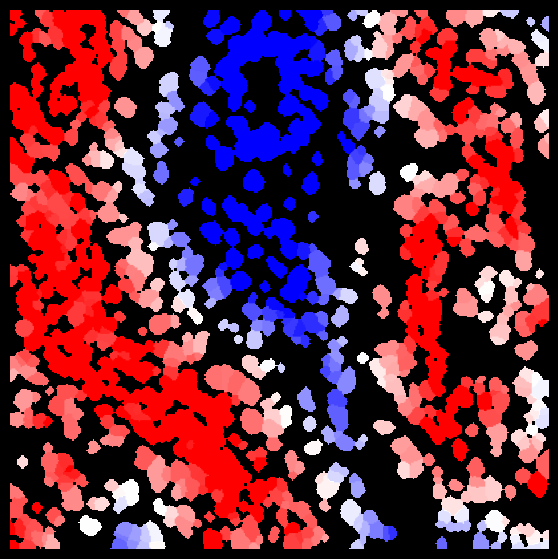

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/905 [00:00<?, ?it/s]

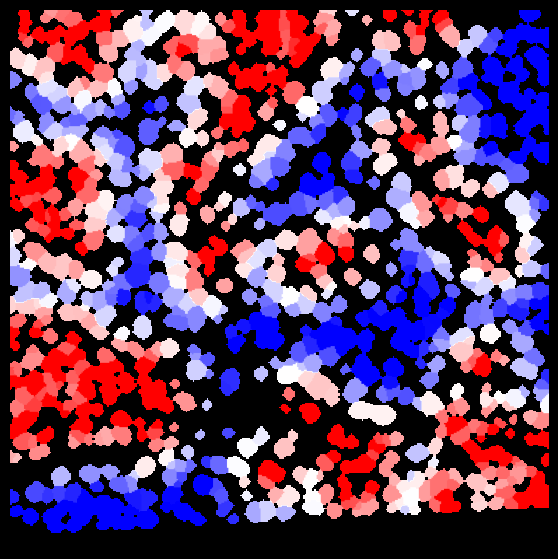

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/970 [00:00<?, ?it/s]

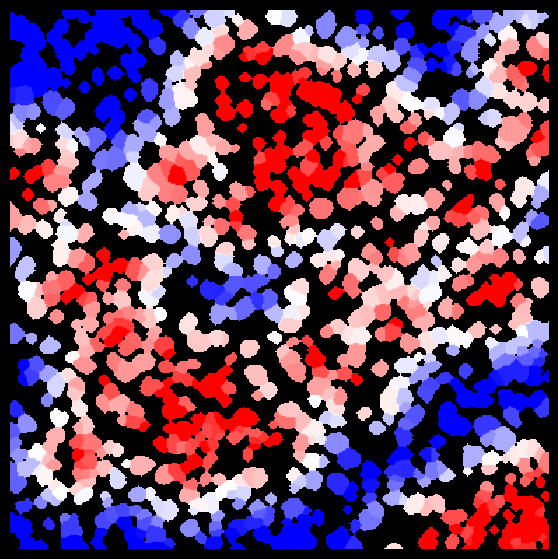

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1282 [00:00<?, ?it/s]

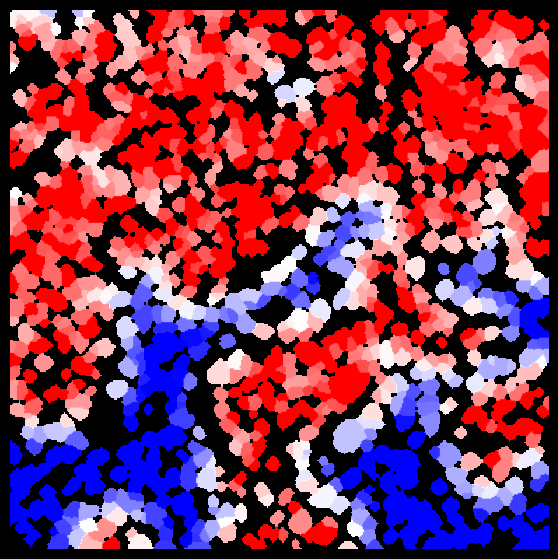

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/866 [00:00<?, ?it/s]

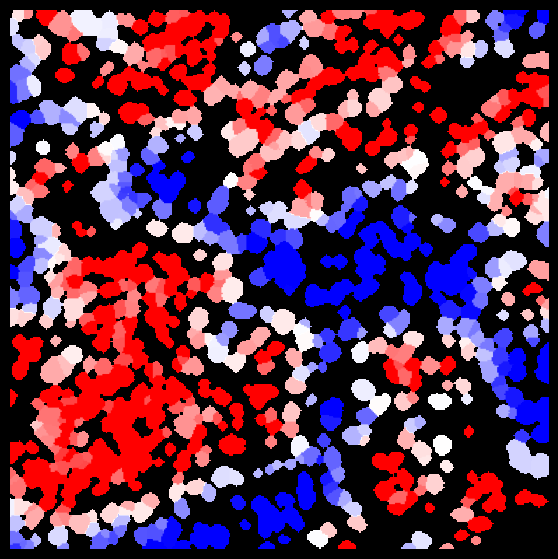

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/948 [00:00<?, ?it/s]

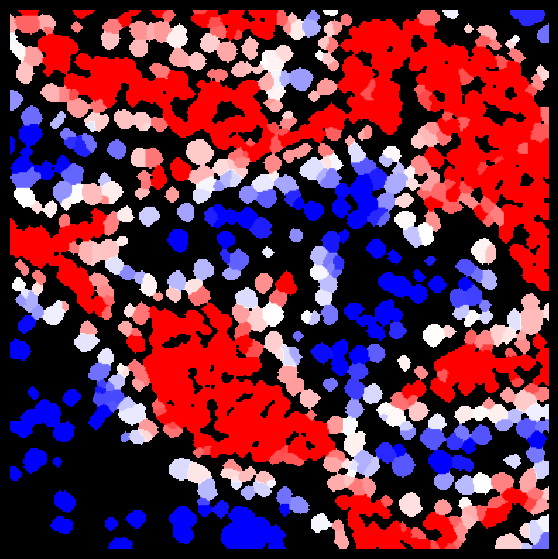

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1117 [00:00<?, ?it/s]

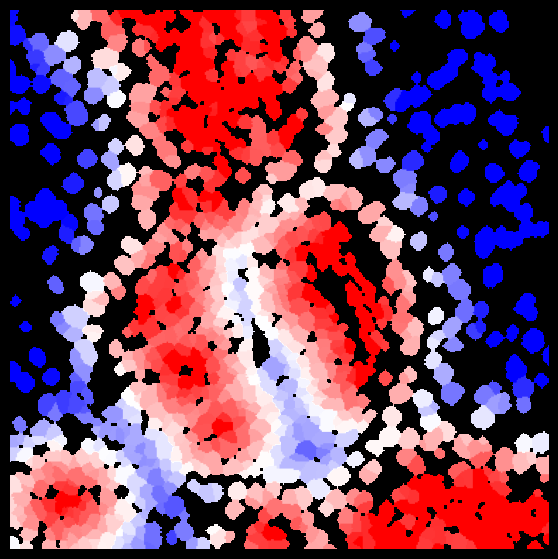

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/738 [00:00<?, ?it/s]

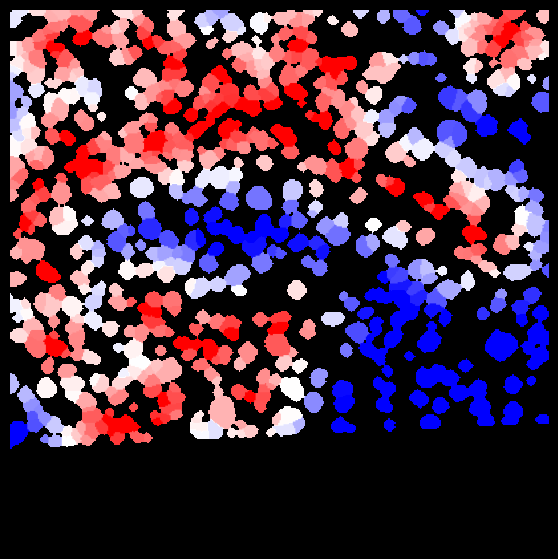

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/931 [00:00<?, ?it/s]

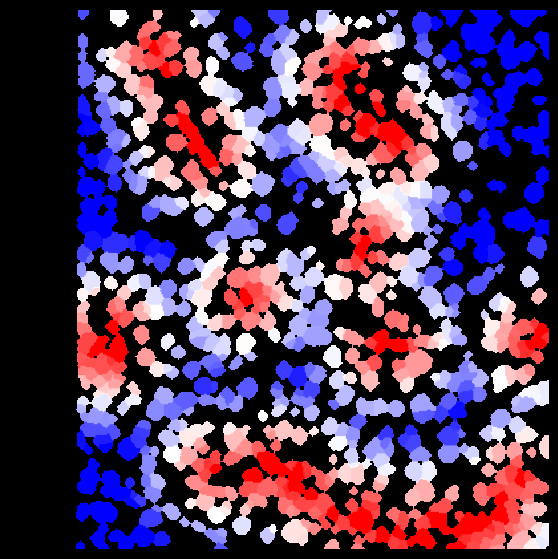

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1293 [00:00<?, ?it/s]

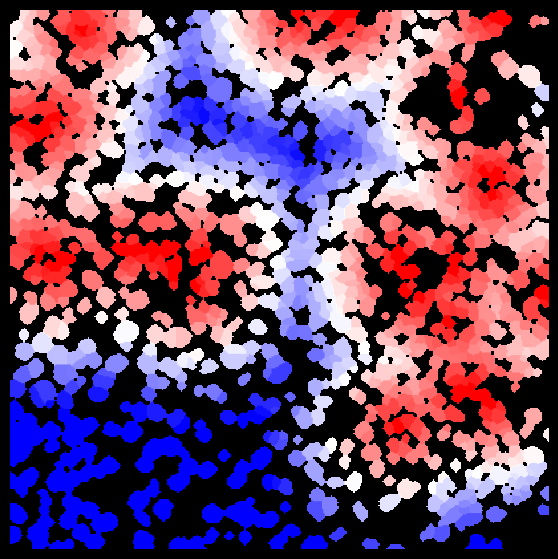

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1209 [00:00<?, ?it/s]

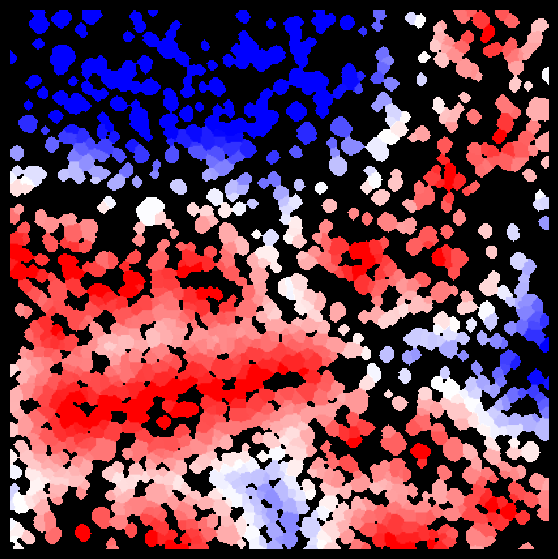

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/533 [00:00<?, ?it/s]

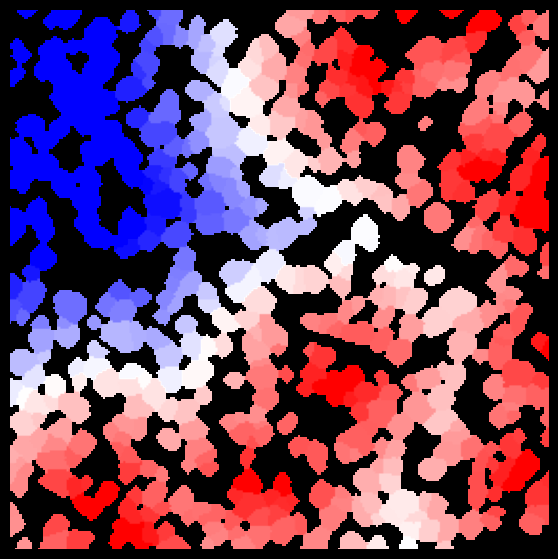

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/415 [00:00<?, ?it/s]

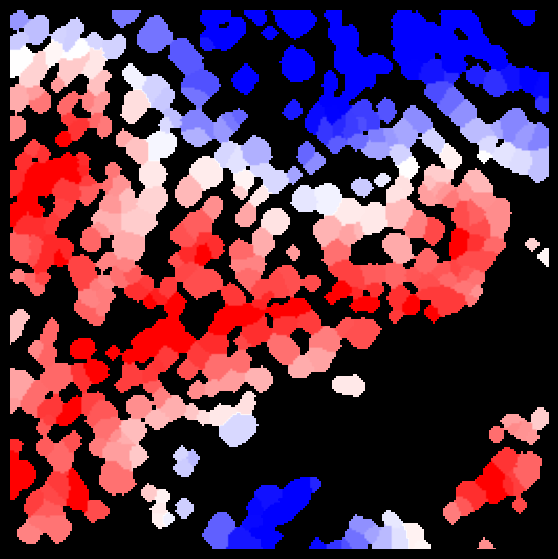

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/474 [00:00<?, ?it/s]

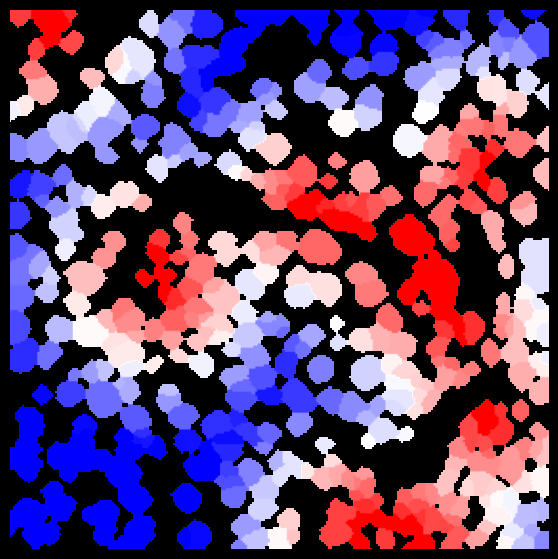

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1072 [00:00<?, ?it/s]

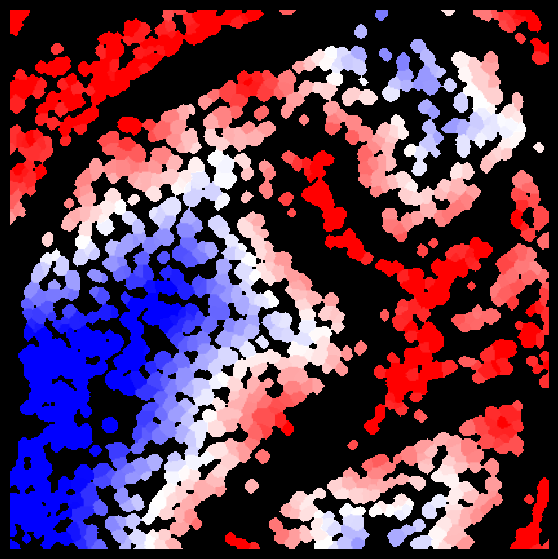

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1180 [00:00<?, ?it/s]

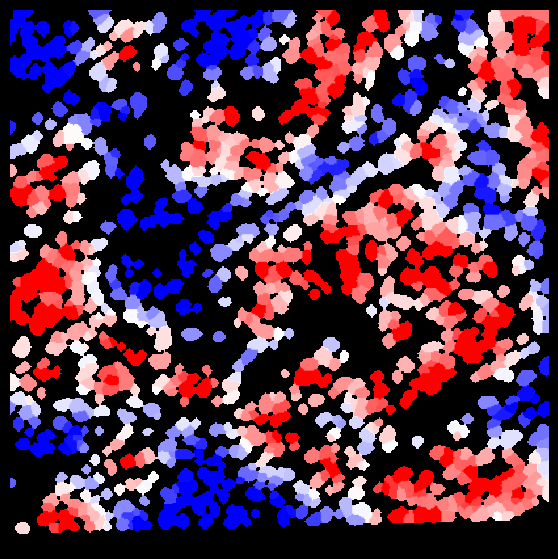

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/1133 [00:00<?, ?it/s]

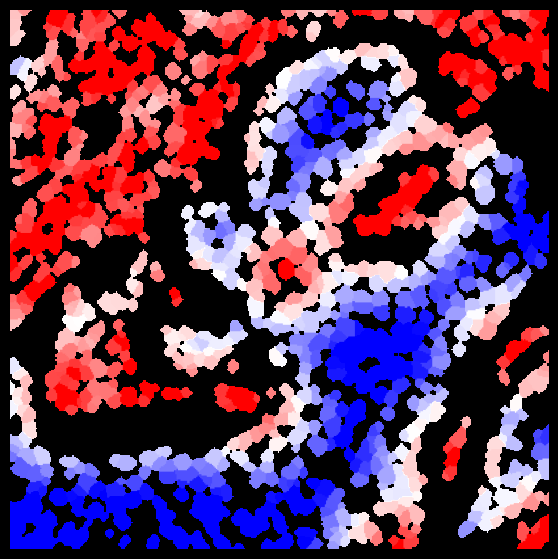

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/450 [00:00<?, ?it/s]

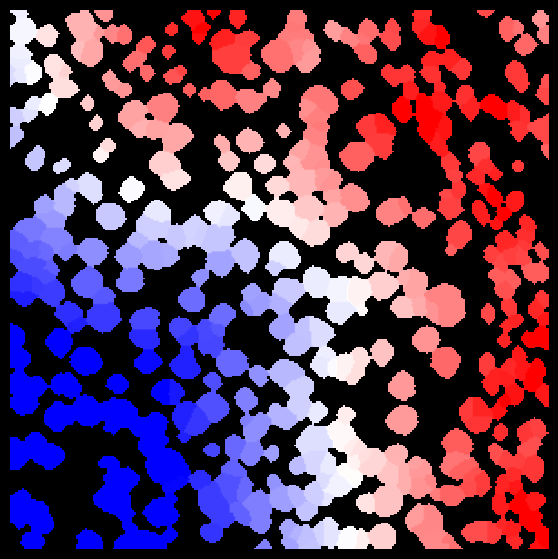

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/645 [00:00<?, ?it/s]

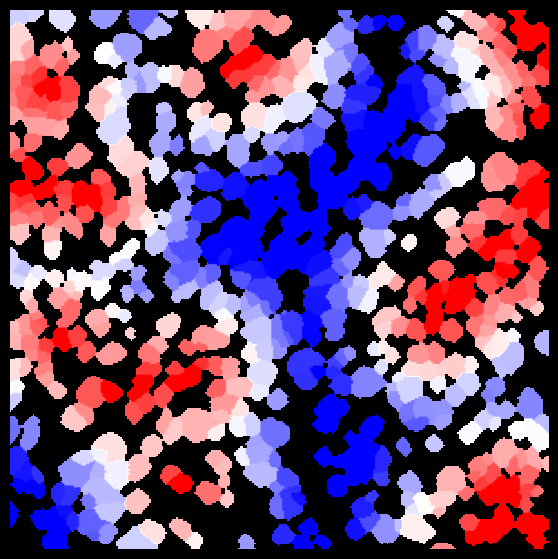

In [26]:
for dataset in adata_CN.obs['Dataset'].unique():
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
    
    adata_ref = adata_fov[adata_fov[:,'CD31'].X > 0.05]
    if len(adata_ref) < 10:
        continue
    
    d = get_distance(adata_fov, adata_ref)
    label2cell = {}
    cell_ids = adata_fov.obs.Cell.to_list()

    for i, cell in enumerate(cell_ids):
        label2cell[cell] = d[i]

    img = create_clustered_cell(mask, label2cell)

    fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
    ax.imshow(img, cmap='bwr_r', vmax=np.nanquantile(img, 0.9))
    ax.axis("off")
    plt.show()


# Distance analysis

In [27]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

In [28]:
distances = []
adatas = []
adatas_SIMS = []
scaler = StandardScaler()

for dataset in adata_CN.obs['Dataset'].unique():
    adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
    adata_fov_sims = adata[adata.obs['Dataset'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
    
    adata_ref = adata_fov[adata_fov[:,'CD31'].X > 0.05]
    if len(adata_ref) < 10:
        continue
    
    
    d = get_distance(adata_fov, adata_ref)
    d = scaler.fit_transform(d)
    d = d.flatten()
    
    distances.append(d)
    adatas.append(adata_fov)
    adatas_SIMS.append(adata_fov_sims)

In [29]:
distance = np.concatenate(distances)
adata_distance = ad.concat(adatas_SIMS)

df = pd.DataFrame(adata_distance.X, columns=adata_distance.var_names.tolist())
df['Proximity to CD31'] = -distance
df_corr = df.corr()


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [30]:
n = 8
marker = 'Proximity to CD31'
n_cut = 25

# Get positive and negative correlation
corr_pos = df_corr.loc[marker].nlargest(25).index.tolist()
corr_neg = df_corr.loc[marker].nsmallest(25).index.tolist()

# Get only SIMS masses
corr_pos = [corr for corr in corr_pos if corr in SIMS_nm_subset][:n]
corr_neg = [corr for corr in corr_neg if corr in SIMS_nm_subset][:n]
corr_list = [marker] + corr_pos + corr_neg

# Get range 
df_intensity = df[corr_list]
df_intensity.sort_values(by=[marker], inplace=True)
df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop') 

LE = LabelEncoder()
df_intensity[f'{marker} cut'] = LE.fit_transform(df_intensity[f'{marker} cut'])

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1028058216.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_intensity.sort_values(by=[marker], inplace=True)
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1028058216.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop')
C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1028058216.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

In [31]:
df_sort = df_intensity.groupby('Proximity to CD31 cut').mean()

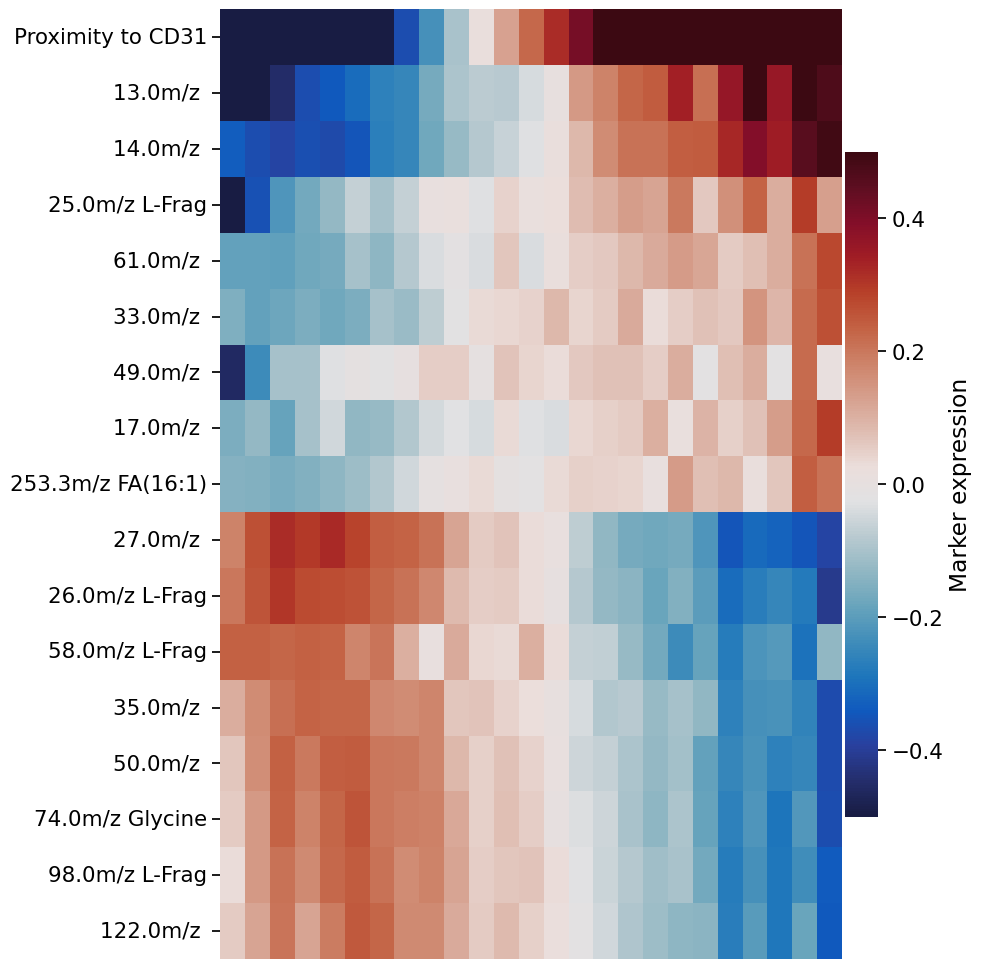

In [32]:
with sns.plotting_context('notebook', font_scale=1.4):
    fig, ax = plt.subplots(figsize=(10,10))
    ax = sns.heatmap(df_sort.T, ax=ax, cmap=heatmap_cmp,
                     xticklabels=False, yticklabels=True, 
                     cbar_kws={"label": "Marker expression", "pad": 0.004, "shrink": 0.7}, 
                     vmin=-0.5, vmax=0.5)
    ax.set(xlabel='')
    plt.tight_layout()
    plt.show()

# CD31 on metabolites channel

In [33]:
import palettable
h5_data_dir = p_dir / "data" / "h5"
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

from typing import List
import matplotlib
import skimage
from skimage import measure

h5_data_dir = p_dir / "data" / "h5"

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(mz_img, cmap='rainbow', interpolation='quadric', vmin=0, vmax=np.percentile(mz_img, 90))  
    ax.axis('off')
    plt.title(f'{mz} m/z')
    plt.show()
    return mz_img 

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]

    return mz_img 

In [34]:
dataset = 'E4_1'


In [35]:
masses = corr_pos + corr_neg

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\1940308597.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/73 [00:00<?, ?it/s]

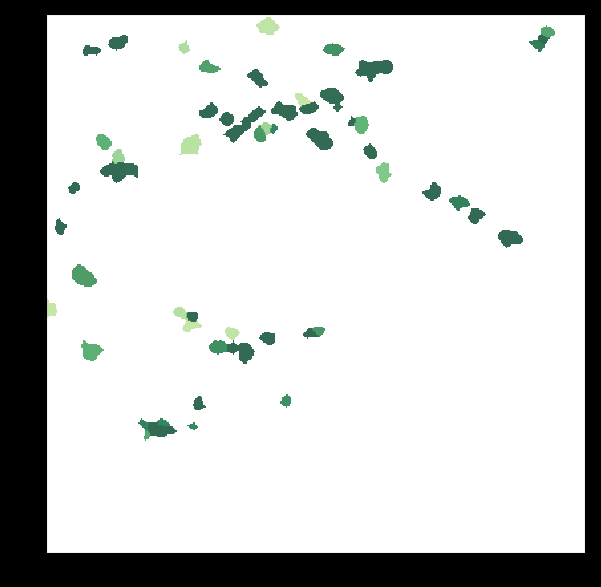

In [36]:
adata_fov = adata_CN[adata_CN.obs['Dataset'] == dataset]
try:
    mask = masks["_".join([experiment, dataset])]
    contours = get_contour(mask)
except:
    print(dataset)

 # Get label2cell dict

label2cell = {}
cell_ids = np.array(adata_fov.obs.Cell.to_list())
intensities = adata_fov[:,'CD31'].X.flatten()
positif = intensities > 0
intensities = intensities[positif]

for i, cell in enumerate(cell_ids[positif]):
    label2cell[cell] = intensities[i]

img = create_clustered_cell(mask, label2cell)

fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
ax.imshow(img, cmap='YlGn', vmin=-0.5, vmax=1, alpha=0.8)
plt.show()

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\skimage\transform\_warps.py:725: RuntimeWarning: All-NaN slice encountered
  min_val = min_func(input_image)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\skimage\transform\_warps.py:729: RuntimeWarning: All-NaN slice encountered
  max_val = max_func(input_image)


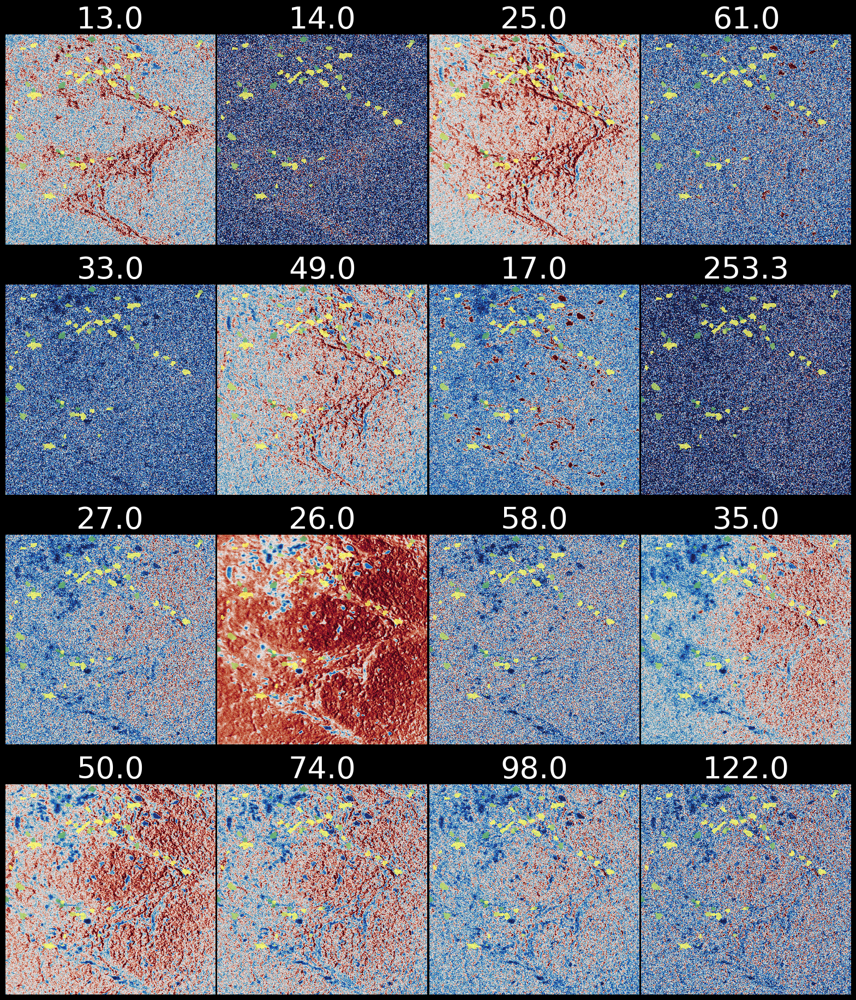

In [37]:
# Read SIMS data
imgs, labels = get_imgs_sims(experiment, 'auto_'+dataset)
mzs = np.array(df_intensity_TS.columns.tolist()).astype(float)

# Plot SIMS
fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses):
    ax = axs[i]
    
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    
    ax.imshow(mz_img, cmap=heatmap_cmp, interpolation=None, vmin=0, vmax=np.percentile(mz_img, 95))
    ax.set_title(mz, size=40, c='w')
    ax.axis("off")
    ax.imshow(resize(img, mz_img.shape), cmap='summer', vmin=-0.5, vmax=1, alpha=0.8)

fig.subplots_adjust(wspace=0.01, hspace=0.15)
plt.show()


# Topographic plot

In [268]:
from scipy.ndimage import gaussian_filter
import matplotlib.colors as mcolors
from skimage.measure import block_reduce

n_color = 3
colors = [(0/255,200/255,20/255, c) for c in np.linspace(0, 1, 100)]
cmapred = mcolors.LinearSegmentedColormap.from_list("mycmap", colors, N=n_color + 1)

In [315]:
for i, channel in enumerate(masses):
    ax = axs[i]
    
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    break

In [316]:
X = [i for i in range(mz_img.shape[0])]
Y = [i for i in range(mz_img.shape[1])]

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\skimage\transform\_warps.py:725: RuntimeWarning: All-NaN slice encountered
  min_val = min_func(input_image)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\skimage\transform\_warps.py:729: RuntimeWarning: All-NaN slice encountered
  max_val = max_func(input_image)


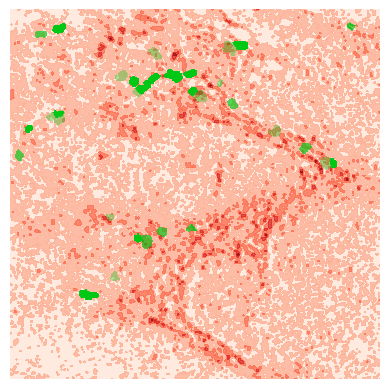

In [317]:
fig, ax = plt.subplots()
ax.contourf(X, Y, gaussian_filter(mz_img, sigma=1), cmap='Reds', levels=4, alpha=0.8)
ax.contourf(X, Y, resize(img, mz_img.shape), cmap=cmapred)
ax.axis('off')
ax.invert_yaxis()
ax.set_aspect('equal')

In [318]:
size = 32
xv = [i for i in range(img_size // size)]
yv = [i for i in range(img_size // size)]
img_reduced = block_reduce(mz_img, block_size = (size,size), func=np.mean)

dx, dy = np.gradient(-img_reduced)
x,y = np.meshgrid(xv,yv)
x *= size
y *= size

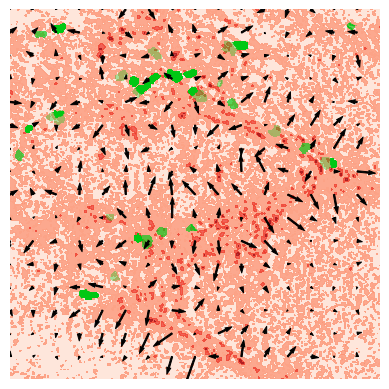

In [329]:
fig, ax = plt.subplots()
ax.contourf(X, Y, gaussian_filter(mz_img, sigma=1), cmap='Reds', levels=3, alpha=0.8)
ax.contourf(X, Y, resize(img, mz_img.shape), cmap=cmapred)
ax.quiver(x,y,dy,dx,angles='xy',color='k', scale_units='width', scale=15, linewidths=0.7, edgecolors='k')
ax.axis('off')
ax.invert_yaxis()
ax.set_aspect('equal')

In [ ]:
img_size = mz_img.shape[0]
size = 16
X = [i for i in range(img_size // size)]
Y = [i for i in range(img_size // size)]
x,y = np.meshgrid(X,Y)
x = x.flatten()
y = y.flatten()
mean_rep = []

for i, channel in enumerate(masses):
    ax = axs[i]
    
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    img_reduced = block_reduce(mz_img, block_size = (size,size), func=np.mean)
    mean_rep.append(img_reduced[x,y])



In [ ]:
a_grid = ad.AnnData(np.stack(mean_rep, axis=1))
a_grid.var_names = masses
a_grid.obsm['spatial'] = np.concatenate([y[:, np.newaxis], x[:, np.newaxis]], axis=1)

C:\Users\thu71\AppData\Local\Temp\ipykernel_9448\2920156192.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  a_grid = ad.AnnData(np.stack(mean_rep, axis=1))


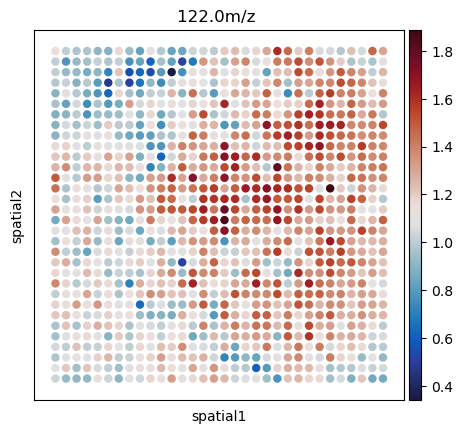

In [ ]:
sc.pl.spatial(a_grid, color=['122.0m/z '], cmap=heatmap_cmp, spot_size=0.8)
